# Welcome to SAiDL CTE 2026!
# ML101
---

In [ ]:
!pip install ipywidgets plotly --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 8.0 MB/s eta 0:00:00


In [4]:
import numpy as np, random, urllib.request, warnings
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import torch, torch.nn as nn
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

SEED = 42
np.random.seed(SEED); random.seed(SEED); torch.manual_seed(SEED)
plt.rcParams["figure.dpi"] = 110

---
# A simple model to predict pizza prices
## Can you guess the price?

A fictional pizza shop gives us pizza diameters and prices.

**Input:** diameter. **Target:** price.

Before we fit anything: what price would you predict for a 12-inch pizza?

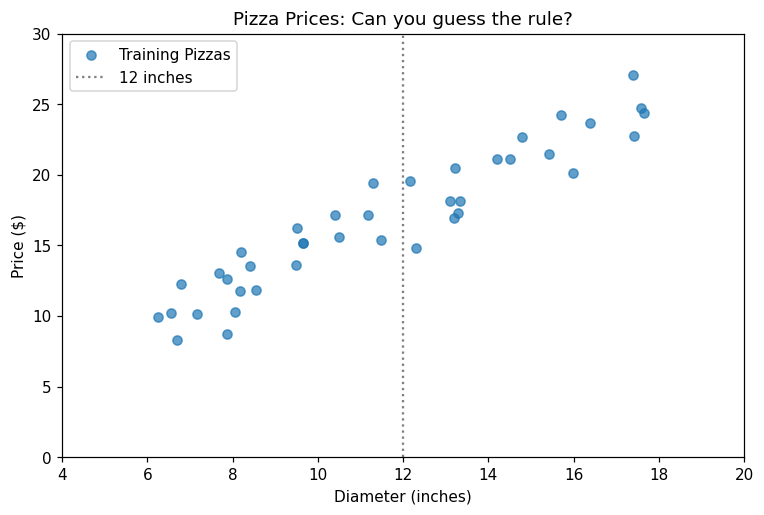

In [ ]:
rng_train = np.random.RandomState(SEED)
diameters_train = rng_train.uniform(6, 18, 40)
prices_train = 2.0 + 1.3 * diameters_train + rng_train.normal(0, 1.8, 40)

rng_test = np.random.RandomState(SEED + 1)
diameters_test = rng_test.uniform(6, 18, 20)
prices_test = 2.0 + 1.3 * diameters_test + rng_test.normal(0, 1.8, 20)

train_mean = np.mean(diameters_train)
train_std = np.std(diameters_train)
diameters_train_scaled = (diameters_train - train_mean) / train_std
diameters_test_scaled = (diameters_test - train_mean) / train_std

regression_data = {
    'x_train': diameters_train,
    'y_train': prices_train,
    'x_test': diameters_test,
    'y_test': prices_test,
    'x_train_scaled': diameters_train_scaled,
    'x_test_scaled': diameters_test_scaled,
    'mean': train_mean,
    'std': train_std
}


fig, ax = plt.subplots(figsize=(8, 5))
ax.scatter(diameters_train, prices_train, alpha=0.7, label="Training Pizzas", color="C0")
ax.axvline(12, color="gray", linestyle=":", label="12 inches")

# audience_prediction_12_inch = 0
# ax.plot(12, audience_prediction_12_inch, marker="*", color="red", markersize=15, label="Audience Prediction")

ax.set_xlim(4, 20)
ax.set_ylim(0, 30)
ax.set_xlabel("Diameter (inches)")
ax.set_ylabel("Price ($)")
ax.set_title("Pizza Prices: Can you guess the rule?")
ax.legend()
plt.show()

### Our prediction is a straight line:

**predicted price = slope × diameter + intercept**

- The **slope** changes the tilt.
- The **intercept** shifts the line up or down.

Try to fit the dots using just those two knobs.

In [ ]:
import ipywidgets as widgets
from IPython.display import display

def predict_line(slope, intercept, x):
    return slope * x + intercept

def mean_squared_error(y_pred, y_true):
    return np.mean((y_pred - y_true) ** 2)

def phys_to_scaled(p_slope, p_intercept, mean, std):
    scaled_weight = p_slope * std
    scaled_bias = p_intercept + p_slope * mean
    return scaled_weight, scaled_bias

def scaled_to_phys(s_weight, s_bias, mean, std):
    p_slope = s_weight / std
    p_intercept = s_bias - s_weight * mean / std
    return p_slope, p_intercept

# Globals to store the last selected scaled parameters for the next pair
scaled_weight_init, scaled_bias_init = 0.0, 0.0

def update_plot(physical_slope, physical_intercept):
    global scaled_weight_init, scaled_bias_init
    scaled_weight_init, scaled_bias_init = phys_to_scaled(
        physical_slope, physical_intercept, train_mean, train_std
    )

    preds_train = predict_line(physical_slope, physical_intercept, regression_data['x_train'])
    mse_train = mean_squared_error(preds_train, regression_data['y_train'])

    fig, ax = plt.subplots(figsize=(8, 5))
    ax.scatter(regression_data['x_train'], regression_data['y_train'], alpha=0.7, color="C0")

    x_range = np.array([4, 20])
    ax.plot(x_range, predict_line(physical_slope, physical_intercept, x_range), color="red", linewidth=2, label="Prediction Line")

    for x, y, p in zip(regression_data['x_train'], regression_data['y_train'], preds_train):
        ax.plot([x, x], [y, p], color="gray", linestyle="--", alpha=0.5)

    ax.set_xlim(4, 20)
    ax.set_ylim(0, 30)
    ax.set_xlabel("Diameter (inches)")
    ax.set_ylabel("Price ($)")
    ax.set_title(f"Training MSE (Average Squared Miss): {mse_train:.2f}")
    ax.legend()
    plt.show()

# Create sliders
slope_slider = widgets.FloatSlider(value=1.0, min=-1.0, max=3.0, step=0.1, description='Slope:')
intercept_slider = widgets.FloatSlider(value=4.0, min=-10.0, max=20.0, step=0.5, description='Intercept:')

widgets.interact(update_plot, physical_slope=slope_slider, physical_intercept=intercept_slider);

interactive(children=(FloatSlider(value=1.0, description='Slope:', max=3.0, min=-1.0), FloatSlider(value=4.0, …

## Every line has a score

A line that misses the dots badly gets a high error score. A better-fitting line gets a lower score.

Imagine trying every possible line and recording its score. Those scores form a landscape.

**Our mission: find a low point.**

On the next picture, the landscape axes are model settings, not pizza diameters and prices.

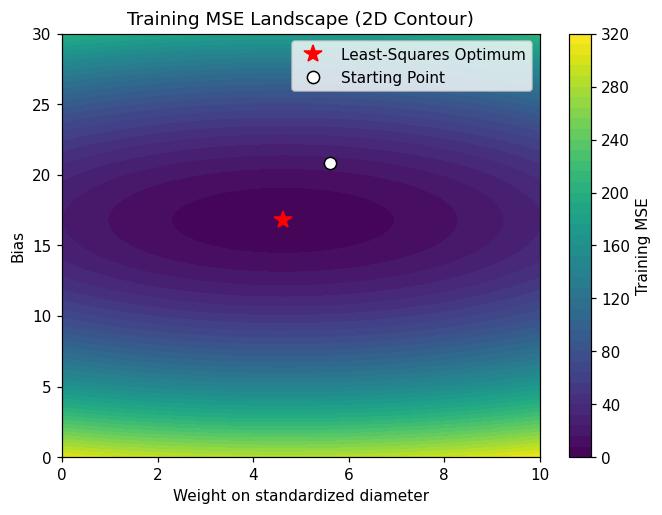

In [ ]:
import plotly.graph_objects as go

w_grid = np.linspace(0, 10, 70)
b_grid = np.linspace(0, 30, 70)
W, B = np.meshgrid(w_grid, b_grid)

def mse_scaled(w, b):
    preds = w * regression_data['x_train_scaled'] + b
    return np.mean((preds - regression_data['y_train']) ** 2)

Z = np.zeros_like(W)
for i in range(W.shape[0]):
    for j in range(W.shape[1]):
        Z[i, j] = mse_scaled(W[i, j], B[i, j])

X_design = np.vstack([regression_data['x_train_scaled'], np.ones_like(regression_data['x_train_scaled'])]).T
opt_w, opt_b = np.linalg.lstsq(X_design, regression_data['y_train'], rcond=None)[0]

loss_grid = {'W': W, 'B': B, 'Z': Z, 'w_opt': opt_w, 'b_opt': opt_b}

# 1. 2D Contour Plot (Matplotlib)
fig, ax1 = plt.subplots(figsize=(7, 5))
contour = ax1.contourf(W, B, Z, levels=40, cmap="viridis")
ax1.plot(opt_w, opt_b, "r*", markersize=12, label="Least-Squares Optimum")
ax1.plot(scaled_weight_init, scaled_bias_init, "wo", markeredgecolor="black", markersize=8, label="Starting Point")
ax1.set_xlabel("Weight on standardized diameter")
ax1.set_ylabel("Bias")
ax1.set_title("Training MSE Landscape (2D Contour)")
ax1.legend()
fig.colorbar(contour, ax=ax1, label="Training MSE")
plt.show()

# 2. Interactive 3D Surface Plot (Plotly)
fig_3d = go.Figure(data=[go.Surface(z=Z, x=W, y=B, colorscale='viridis', opacity=0.8)])

# Add the optimum point as a 3D scatter marker
fig_3d.add_trace(go.Scatter3d(
    x=[opt_w], y=[opt_b], z=[mse_scaled(opt_w, opt_b)],
    mode='markers', marker=dict(size=8, color='red', symbol='cross'),
    name='Optimum'
))

# Add the starting point from sliders
fig_3d.add_trace(go.Scatter3d(
    x=[scaled_weight_init], y=[scaled_bias_init], z=[mse_scaled(scaled_weight_init, scaled_bias_init)],
    mode='markers', marker=dict(size=6, color='white', line=dict(color='black', width=2)),
    name='Starting Point'
))

fig_3d.update_layout(
    title="Training MSE Landscape (Interactive 3D)",
    scene=dict(
        xaxis_title='Weight',
        yaxis_title='Bias',
        zaxis_title='Training MSE'
    ),
    width=800, height=600,
    margin=dict(l=0, r=0, b=0, t=40)
)
fig_3d.show()

## Gradient descent: a little less wrong each time

Repeat four steps:

1. Make predictions.
2. Measure the mistakes.
3. Find which small change would reduce the mistakes.
4. Move the settings a little that way.

The **learning rate** controls the size of the move.

In [ ]:
def run_gradient_descent(x, y, w_init, b_init, lr=0.01, steps=120):
    w, b = w_init, b_init
    history = []

    for step in range(steps + 1):
        preds = w * x + b
        residual = preds - y
        loss = np.mean(residual ** 2)

        gw = 2 * np.mean(residual * x)
        gb = 2 * np.mean(residual)

        history.append({
            'step': step, 'weight': w, 'bias': b, 'loss': loss,
            'gw': gw, 'gb': gb
        })

        if step < steps:
            w -= lr * gw
            b -= lr * gb

    return history

gd_history = run_gradient_descent(
    regression_data['x_train_scaled'],
    regression_data['y_train'],
    scaled_weight_init,
    scaled_bias_init
)

eps = 1e-5
l_plus = mse_scaled(scaled_weight_init + eps, scaled_bias_init)
l_minus = mse_scaled(scaled_weight_init - eps, scaled_bias_init)
fd_gw = (l_plus - l_minus) / (2 * eps)
assert np.isclose(fd_gw, gd_history[0]['gw'], rtol=1e-3)

print(f"Initial error: {gd_history[0]['loss']:.2f}")
print(f"Final error: {gd_history[-1]['loss']:.2f}")
print(f"Updates: {len(gd_history) - 1}")

Initial error: 20.15
Final error: 2.65
Updates: 120


In [ ]:
history_sub = gd_history[::2]

fig, (ax_data, ax_loss_grid, ax_curve) = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle("Gradient Descent: One update, three views", fontsize=14)

ax_data.scatter(regression_data['x_train'], regression_data['y_train'], alpha=0.6)
line_pred, = ax_data.plot([], [], color='red', lw=2)
res_lines = [ax_data.plot([], [], color='gray', linestyle='--', alpha=0.5)[0] for _ in range(5)]
sample_idx = np.linspace(0, len(regression_data['x_train'])-1, 5, dtype=int)
ax_data.set_xlim(4, 20); ax_data.set_ylim(0, 30)
ax_data.set_xlabel("Diameter (inches)"); ax_data.set_ylabel("Price ($)")

ax_loss_grid.contourf(loss_grid['W'], loss_grid['B'], loss_grid['Z'], levels=40, cmap="viridis", alpha=0.6)
ax_loss_grid.plot(loss_grid['w_opt'], loss_grid['b_opt'], "r*", markersize=12)
trail, = ax_loss_grid.plot([], [], 'w--', alpha=0.7)
point_gd, = ax_loss_grid.plot([], [], 'ko', markersize=6)
ax_loss_grid.set_xlabel("Weight"); ax_loss_grid.set_ylabel("Bias")

curve, = ax_curve.plot([], [], 'b-', lw=2)
point_curve, = ax_curve.plot([], [], 'ko', markersize=6)
ax_curve.set_xlim(0, gd_history[-1]['step'])
ax_curve.set_ylim(gd_history[-1]['loss'] * 0.9, gd_history[0]['loss'] * 1.1)
ax_curve.set_xlabel("Update Step"); ax_curve.set_ylabel("Training MSE")

def init():
    line_pred.set_data([], [])
    for rl in res_lines: rl.set_data([], [])
    trail.set_data([], [])
    point_gd.set_data([], [])
    curve.set_data([], [])
    point_curve.set_data([], [])
    return [line_pred, trail, point_gd, curve, point_curve] + res_lines

def update(frame):
    state = history_sub[frame]
    p_slope, p_int = scaled_to_phys(state['weight'], state['bias'], train_mean, train_std)

    x_rng = np.array([4, 20])
    line_pred.set_data(x_rng, p_slope * x_rng + p_int)

    for i, idx in enumerate(sample_idx):
        x_val = regression_data['x_train'][idx]
        y_val = regression_data['y_train'][idx]
        y_p = p_slope * x_val + p_int
        res_lines[i].set_data([x_val, x_val], [y_val, y_p])

    w_hist = [s['weight'] for s in history_sub[:frame+1]]
    b_hist = [s['bias'] for s in history_sub[:frame+1]]
    trail.set_data(w_hist, b_hist)
    point_gd.set_data([state['weight']], [state['bias']])

    steps = [s['step'] for s in history_sub[:frame+1]]
    losses = [s['loss'] for s in history_sub[:frame+1]]
    curve.set_data(steps, losses)
    point_curve.set_data([state['step']], [state['loss']])

    ax_data.set_title(f"Step {state['step']} | MSE: {state['loss']:.2f}")
    return [line_pred, trail, point_gd, curve, point_curve] + res_lines

ani = FuncAnimation(fig, update, frames=len(history_sub), init_func=init, blit=False)
plt.close(fig)
HTML(ani.to_jshtml())

## What if the learner takes enormous steps?

A tiny learning rate can make progress painfully slow.

A sensible learning rate can make useful progress.

An oversized learning rate can jump past the low point and become unstable.


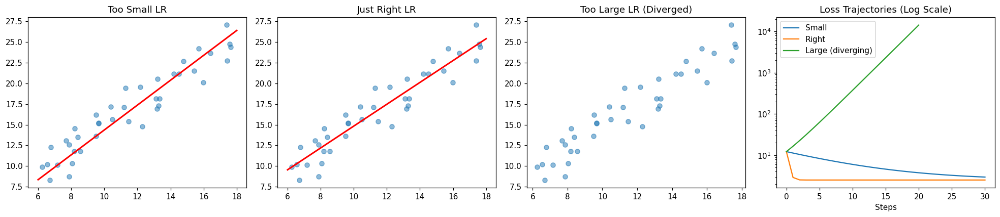

In [ ]:
X_design = np.vstack([regression_data['x_train_scaled'], np.ones_like(regression_data['x_train_scaled'])]).T
H = 2 * (X_design.T @ X_design) / len(regression_data['x_train_scaled'])
largest_eigenvalue = np.max(np.linalg.eigvals(H))

lr_small = 0.05 / largest_eigenvalue
lr_good = 0.8 / largest_eigenvalue
lr_large = 2.2 / largest_eigenvalue

w_init_off = scaled_weight_init + 2.0
b_init_off = scaled_bias_init - 5.0

hist_small = run_gradient_descent(regression_data['x_train_scaled'], regression_data['y_train'], w_init_off, b_init_off, lr=lr_small, steps=30)
hist_good = run_gradient_descent(regression_data['x_train_scaled'], regression_data['y_train'], w_init_off, b_init_off, lr=lr_good, steps=30)

hist_large = []
w, b = w_init_off, b_init_off
for step in range(31):
    preds = w * regression_data['x_train_scaled'] + b
    res = preds - regression_data['y_train']
    loss = np.mean(res**2)
    hist_large.append({'step': step, 'loss': loss})
    if loss > 1e4: break
    w -= lr_large * (2 * np.mean(res * regression_data['x_train_scaled']))
    b -= lr_large * (2 * np.mean(res))

fig, (ax_small, ax_good, ax_large, ax_loss) = plt.subplots(1, 4, figsize=(18, 4))

def plot_fit(ax, hist, title):
    ax.scatter(regression_data['x_train'], regression_data['y_train'], alpha=0.5)
    if hist[-1]['loss'] < 1e4:
        s, i = scaled_to_phys(hist[-1]['weight'], hist[-1]['bias'], train_mean, train_std)
        xr = np.array([6, 18])
        ax.plot(xr, s * xr + i, 'r-', lw=2)
    ax.set_title(title)

plot_fit(ax_small, hist_small, "Too Small LR")
plot_fit(ax_good, hist_good, "Just Right LR")
ax_large.scatter(regression_data['x_train'], regression_data['y_train'], alpha=0.5)
ax_large.set_title("Too Large LR (Diverged)")

ax_loss.plot([h['step'] for h in hist_small], [h['loss'] for h in hist_small], label="Small")
ax_loss.plot([h['step'] for h in hist_good], [h['loss'] for h in hist_good], label="Right")
ax_loss.plot([h['step'] for h in hist_large], [h['loss'] for h in hist_large], label="Large (diverging)")
ax_loss.set_yscale('log')
ax_loss.set_title("Loss Trajectories (Log Scale)")
ax_loss.set_xlabel("Steps")
ax_loss.legend()

plt.tight_layout()
plt.show()

## The real test is a new example

A model can look good on examples it has already seen.

We also care about examples it did **not** train on.

Let's reveal the hidden test pizzas.


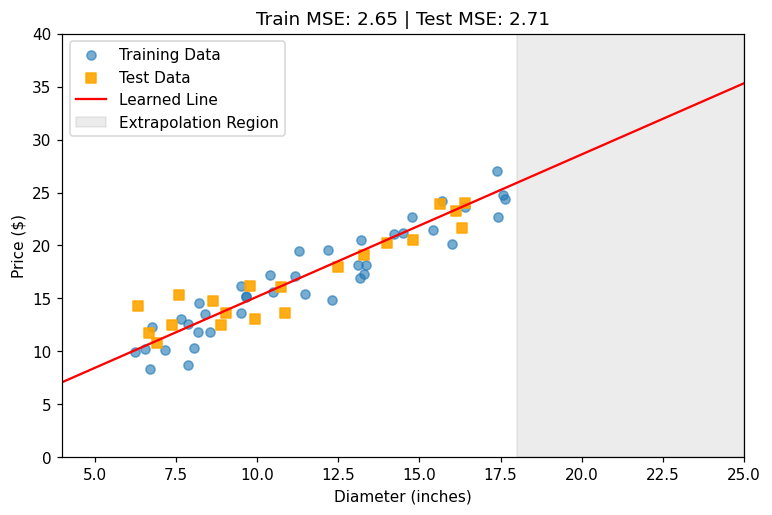

In [ ]:
final_w = gd_history[-1]['weight']
final_b = gd_history[-1]['bias']
final_p_slope, final_p_intercept = scaled_to_phys(final_w, final_b, train_mean, train_std)

preds_test = final_w * regression_data['x_test_scaled'] + final_b
mse_test = np.mean((preds_test - regression_data['y_test']) ** 2)

fig, ax = plt.subplots(figsize=(8, 5))

ax.scatter(regression_data['x_train'], regression_data['y_train'], label="Training Data", alpha=0.6, color="C0")
ax.scatter(regression_data['x_test'], regression_data['y_test'], label="Test Data", alpha=0.9, marker="s", color="orange")

x_extrapolate = np.linspace(4, 25, 100)
ax.plot(x_extrapolate, final_p_slope * x_extrapolate + final_p_intercept, color="red", label="Learned Line")

ax.axvspan(18, 25, color='gray', alpha=0.15, label="Extrapolation Region")

ax.set_xlim(4, 25)
ax.set_ylim(0, 40)
ax.set_xlabel("Diameter (inches)")
ax.set_ylabel("Price ($)")
ax.set_title(f"Train MSE: {gd_history[-1]['loss']:.2f} | Test MSE: {mse_test:.2f}")
ax.legend()
plt.show()

## The Bias-Variance tradeoff

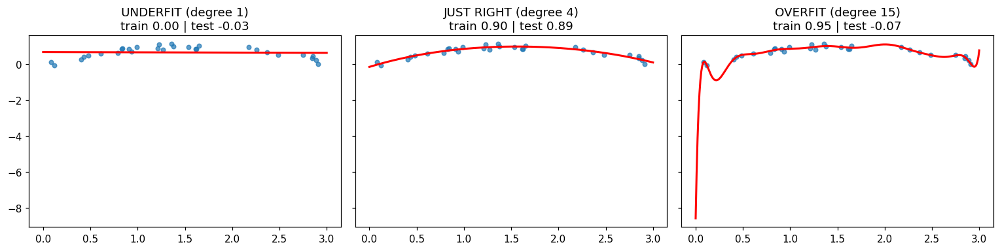

In [ ]:
rng = np.random.default_rng(1)
X = np.sort(rng.uniform(0, 3, 40)).reshape(-1, 1)
y = np.sin(X).ravel() + rng.normal(0, 0.15, 40)
Xtr, Xte, ytr, yte = train_test_split(X, y, random_state=1)
xs = np.linspace(0, 3, 300).reshape(-1, 1)

fig, axes = plt.subplots(1, 3, figsize=(14, 3.6), sharey=True)
for ax, d, tag in zip(axes, [1, 4, 15], ["UNDERFIT (degree 1)", "JUST RIGHT (degree 4)", "OVERFIT (degree 15)"]):
    m = make_pipeline(PolynomialFeatures(d), LinearRegression()).fit(Xtr, ytr)
    ax.scatter(Xtr, y_tr := ytr, s=18, alpha=0.7)
    ax.plot(xs, m.predict(xs), "r-", lw=2)
    ax.set_title(f"{tag}\ntrain {m.score(Xtr, ytr):.2f} | test {m.score(Xte, yte):.2f}")
plt.tight_layout(); plt.show()

In [8]:
import os
import json

try:
    from google.colab import drive
    drive.mount('/content/drive')
except ImportError:
    print("Not running in Colab; skipping Drive mount.")

os.makedirs("assets/pets", exist_ok=True)
IMG_PATH = "assets/pets/Abyssinian_1.jpg"
MASK_PATH = "assets/pets/Abyssinian_1.png"
CLASS_INDEX_PATH = "assets/imagenet_class_index.json"

# 1. Download ImageNet class index for pretrained model groupings
IMAGENET_URL = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
if not os.path.exists(CLASS_INDEX_PATH):
    urllib.request.urlretrieve(IMAGENET_URL, CLASS_INDEX_PATH)

with open(CLASS_INDEX_PATH) as f:
    imagenet_classes = json.load(f)

CAT_IDX = set(range(281, 286))
DOG_IDX = set(range(151, 269))

# 2. Download the real Oxford-IIIT Pet Dataset securely via Torchvision
print("Downloading Oxford-IIIT Pet Dataset (this takes ~15 seconds in Colab)...")
pet_data = datasets.OxfordIIITPet(
    root='assets',
    download=True,
    target_types='segmentation'
)

# Extract the first image (Abyssinian cat) and its trimap mask
img_pil, mask_pil = pet_data[0]

# Save them locally so the rest of the lesson's code works unmodified
img_pil.save(IMG_PATH)
mask_pil.save(MASK_PATH)
print("Images successfully loaded and saved!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


100%|██████████| 792M/792M [00:31<00:00, 25.2MB/s]
100%|██████████| 19.2M/19.2M [00:01<00:00, 14.4MB/s]


Images successfully loaded and saved!


---
# Moving on to **Deep Learning**
## A straight boundary is not always enough

Try separating points inside a ring from points outside it using one straight line.

A neural network combines adjustable pieces to build more flexible rules.

**Predict:** Will a curved boundary always be better on new data?


Finite Difference Check: Exact=-0.000192, Approx=-0.000192


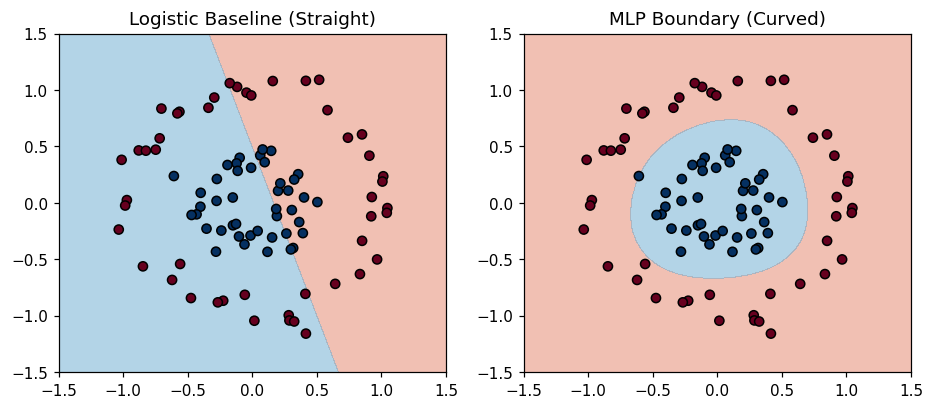

In [ ]:
from sklearn.datasets import make_circles
from sklearn.model_selection import train_test_split

# 1. Generate ring-versus-center dataset
X, y = make_circles(n_samples=600, factor=0.4, noise=0.1, random_state=42)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

X_train_t = torch.tensor(X_train, dtype=torch.float32)
y_train_t = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)

# 2. PyTorch implementations for baseline (logistic) and 2 -> 16 -> 16 -> 1 MLP
logistic_model = nn.Sequential(nn.Linear(2, 1), nn.Sigmoid())
mlp_model = nn.Sequential(
    nn.Linear(2, 16), nn.Tanh(),
    nn.Linear(16, 16), nn.Tanh(),
    nn.Linear(16, 1), nn.Sigmoid()
)

# Full-batch training loop helper
def train_model(model, epochs=1000, lr=0.1):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss()
    for _ in range(epochs):
        optimizer.zero_grad()
        loss = criterion(model(X_train_t), y_train_t)
        loss.backward()
        optimizer.step()

train_model(logistic_model, epochs=100, lr=0.1)
train_model(mlp_model, epochs=500, lr=0.01)

# Finite-difference check on MLP's first layer weight (w_00)
mlp_model.zero_grad()
loss = nn.BCELoss()(mlp_model(X_train_t), y_train_t)
loss.backward()
exact_grad = mlp_model[0].weight.grad[0, 0].item()

eps = 1e-4
with torch.no_grad():
    mlp_model[0].weight[0, 0] += eps
    loss_plus = nn.BCELoss()(mlp_model(X_train_t), y_train_t).item()
    mlp_model[0].weight[0, 0] -= 2 * eps
    loss_minus = nn.BCELoss()(mlp_model(X_train_t), y_train_t).item()
    mlp_model[0].weight[0, 0] += eps  # Restore
approx_grad = (loss_plus - loss_minus) / (2 * eps)
print(f"Finite Difference Check: Exact={exact_grad:.6f}, Approx={approx_grad:.6f}")

# 3. Plot Boundaries
xx, yy = np.meshgrid(np.linspace(-1.5, 1.5, 100), np.linspace(-1.5, 1.5, 100))
grid = torch.tensor(np.c_[xx.ravel(), yy.ravel()], dtype=torch.float32)

with torch.no_grad():
    z_log = logistic_model(grid).numpy().reshape(xx.shape)
    z_mlp = mlp_model(grid).numpy().reshape(xx.shape)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.contourf(xx, yy, z_log, levels=[0, 0.5, 1], cmap="RdBu", alpha=0.5)
ax1.scatter(X_val[:, 0], X_val[:, 1], c=y_val, cmap="RdBu", edgecolors='k')
ax1.set_title("Logistic Baseline (Straight)")

ax2.contourf(xx, yy, z_mlp, levels=[0, 0.5, 1], cmap="RdBu", alpha=0.5)
ax2.scatter(X_val[:, 0], X_val[:, 1], c=y_val, cmap="RdBu", edgecolors='k')
ax2.set_title("MLP Boundary (Curved)")
plt.show()

## NNs on images
## A photograph is a grid of numbers

We see a cat. The computer receives pixel values.

Original Image Shape: (500, 394, 3)
Highlighted Pixel [5,5] RGB: [50, 86, 200]


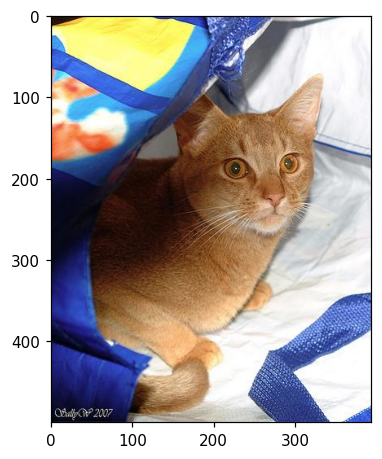

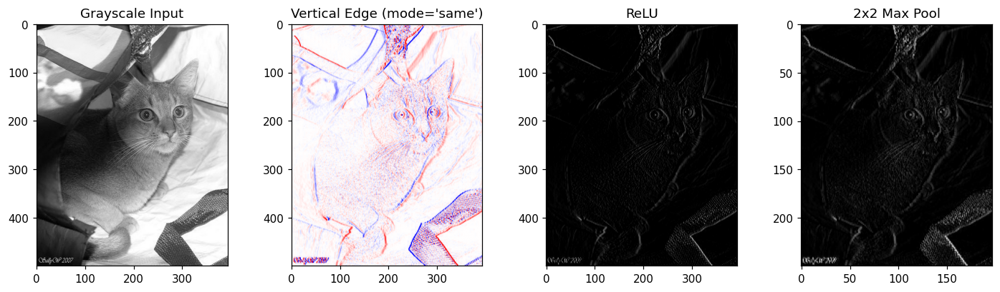

In [ ]:
img = Image.open(IMG_PATH).convert("RGB")
img_arr = np.array(img)
plt.imshow(img)
# 12x12 patch and pixel info
patch = img_arr[100:112, 100:112, :]
r, g, b = patch[:, :, 0], patch[:, :, 1], patch[:, :, 2]
print(f"Original Image Shape: {img_arr.shape}")
print(f"Highlighted Pixel [5,5] RGB: {patch[5,5].tolist()}")



# 4. Apply hand-designed filters to pet image
pet_gray = np.array(img.convert("L"))
pet_edge = correlate2d(pet_gray, kernel_v_edge, mode='same', boundary='symm')

# 5. ReLU + Max Pool
pet_relu = np.maximum(pet_edge, 0)
pet_pool = pet_relu.reshape(pet_relu.shape[0]//2, 2, pet_relu.shape[1]//2, 2).max(axis=(1, 3))

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
axs[0].imshow(pet_gray, cmap="gray")
axs[0].set_title("Grayscale Input")
axs[1].imshow(pet_edge, cmap="bwr", vmin=-255, vmax=255)
axs[1].set_title("Vertical Edge (mode='same')")
axs[2].imshow(pet_relu, cmap="gray")
axs[2].set_title("ReLU")
axs[3].imshow(pet_pool, cmap="gray")
axs[3].set_title("2x2 Max Pool")
plt.show()

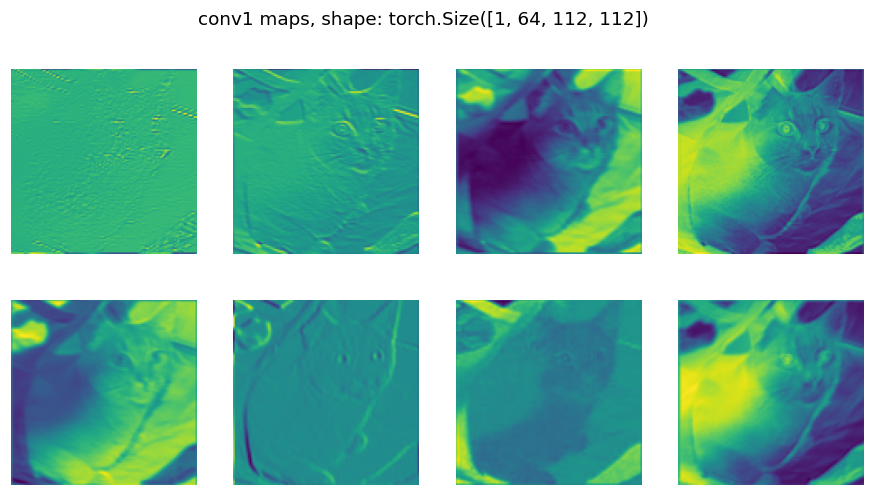

Top 5 ImageNet Classes:
tiger_cat: 0.3432
tabby: 0.2185
Egyptian_cat: 0.0728
plastic_bag: 0.0695
Persian_cat: 0.0262


In [12]:
from torchvision.models import resnet18, ResNet18_Weights
from PIL import Image
import torchvision.transforms.functional as TF

weights = ResNet18_Weights.IMAGENET1K_V1
model = resnet18(weights=weights)
model.eval()
preprocess = weights.transforms()

# Make absolutely sure we are working with a PIL Image, not a numpy array
img_pil = Image.open(IMG_PATH).convert("RGB")

input_tensor = preprocess(img_pil).unsqueeze(0)
# 3. Logits and grouped probabilities
def predict_grouped(img_tensor):
    with torch.inference_mode():
        logits = model(img_tensor)
        probs = torch.softmax(logits, dim=1).squeeze(0)

    cat_mass = sum(probs[i].item() for i in CAT_IDX)
    dog_mass = sum(probs[i].item() for i in DOG_IDX)
    other = 1.0 - cat_mass - dog_mass
    return probs, {"Cat": cat_mass, "Dog": dog_mass, "Other": other}

probs_orig, groups_orig = predict_grouped(input_tensor)
top5_prob, top5_catid = torch.topk(probs_orig, 5)

activations = {}
def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach().cpu().clone()
    return hook

hooks = [
    model.conv1.register_forward_hook(get_activation('conv1')),
    model.layer1.register_forward_hook(get_activation('layer1')),
    model.layer2.register_forward_hook(get_activation('layer2'))
]

try:
    with torch.inference_mode():
        model(input_tensor)
finally:
    for h in hooks:
        h.remove()

# Visualize feature maps (8 channels from conv1)
fig, axs = plt.subplots(2, 4, figsize=(10, 5))
fig.suptitle(f"conv1 maps, shape: {activations['conv1'].shape}")
for i in range(8):
    fmap = activations['conv1'][0, i].numpy()
    axs[i//4, i%4].imshow(fmap, cmap="viridis")
    axs[i//4, i%4].axis('off')
plt.show()


print("Top 5 ImageNet Classes:")
for i in range(5):
    print(f"{imagenet_classes[str(top5_catid[i].item())][1]}: {top5_prob[i].item():.4f}")

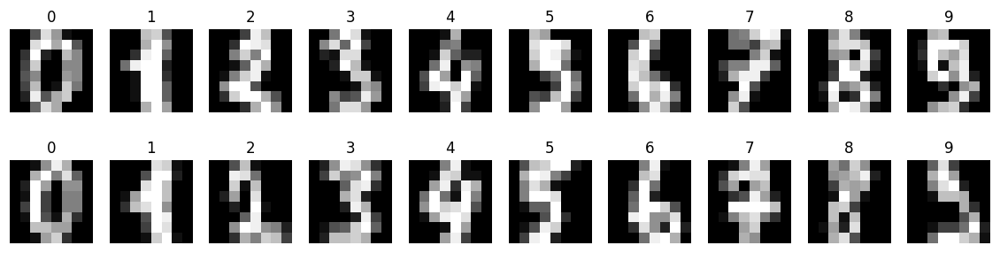

In [ ]:

digits = load_digits()
fig, axes = plt.subplots(2, 10, figsize=(13, 3.2))
for ax, img, lbl in zip(axes.ravel(), digits.images, digits.target):
    ax.imshow(img, cmap="gray"); ax.set_title(lbl, fontsize=11); ax.axis("off")
plt.show()

---
# Modern AI - The Transformer Archtecture


In [ ]:
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer


print("Loading DistilGPT-2")
tokenizer = AutoTokenizer.from_pretrained("distilgpt2")
model = AutoModelForCausalLM.from_pretrained("distilgpt2")
print("Type 'quit' at any prompt to stop.\n")

while True:
    # Get the initial prompt from the user
    user_prompt = input("Seed tokens: ")


    # Get the temperature (creativity slider)
    temp_input = input("Set creativity (Temperature from 0.1 [predictable] to 2.0 [wild], default 0.7):\n> ")
    if temp_input.lower() in ['quit', 'exit', 'stop']:
        break

    try:
        temperature = float(temp_input)
    except ValueError:
        temperature = 0.7  # Fallback if the user types something invalid
        print("Invalid number. Using default temperature: 0.7")

    # 3. Tokenize input and generate text
    inputs = tokenizer(user_prompt, return_tensors="pt")

    print(f"\nGenerating with temperature {temperature}...\n")

    outputs = model.generate(
        **inputs,
        max_new_tokens=500,          # Number of tokens to add
        temperature=temperature,    # Controls randomness/creativity
        do_sample=True,             # Required for temperature to take effect
        top_k=50,                   # Limits sampling to the top 50 most likely next words
        pad_token_id=tokenizer.eos_token_id
    )

    # 4. Decode and print the result
    generated_text = tokenizer.decode(outputs[0], skip_special_tokens=True)


    print(generated_text)

Loading DistilGPT-2


config.json:   0%|          | 0.00/762 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  353MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

Type 'quit' at any prompt to stop.


Generating with temperature 1.5...

the answer to the universe is ‑the same,” said John Danton, the Director of Umpqua Community Foundation. ‑The answer to this question must go into an internal debate and there are many elements within the community. You will notice a lot of folks working very hard after each one goes public. That‣s where the question falls.
I would certainly ask if anybody cares if you make your money, I could not say no at any other point since you did the job after one last job (I can say yes to not even going public). So let it drop before there is another.
It all stems from how we worked and where the jobs fit in there. In that case we hired a couple out in our area for work for ourselves, who could fill that role for the long haul — and who could hire us, to get to where this new job should be.
For me, that job has many elements outside of being the job in the community, to look at the job-to-job comparison. Some people belie

## After practice: a learned policy
A pilot's settings were learned before class by interacting with the simulator.

We are now watching it use those settings. It is not learning during this rollout.



Displaying GIF:


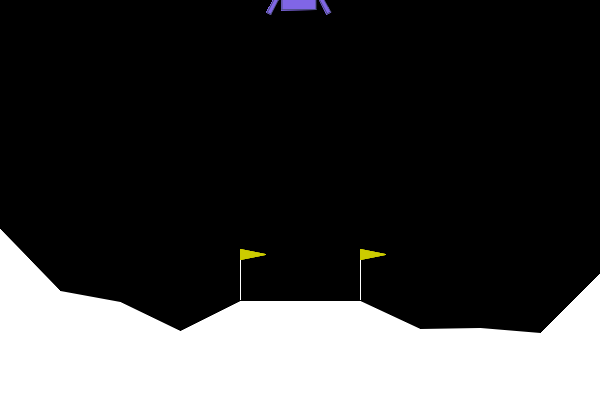

In [ ]:
import os
import urllib.request
from IPython.display import Image, display
from google.colab import drive


url = "https://gymnasium.farama.org/_images/lunar_lander.gif"

urllib.request.urlretrieve(url, save_path)


print("Displaying GIF:")
display(Image(filename=save_path))